# DL PROJECT 

### HRISHIKESH G KULKARNI (21BAI1660)
### TEJAS MANDLOI (21BAI1227)

# Problem Statement

<p style="font-size:25px">Generating Brain Tumor MRI images for Data Augmentation using Generative Adversarial Networks</p>

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam
except:
    from keras.optimizers import Adam

In [2]:
NOISE_DIM = 100  
BATCH_SIZE = 4 
STEPS_PER_EPOCH = 3750
EPOCHS = 10
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [3]:
MAIN_DIR = "../input/brain-mri-images-for-brain-tumor-detection/yes"

# Loading and Preprocessing the Images

In [4]:
def load_images(folder):
    
    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue
        
    imgs = np.array(imgs)
    labels = np.array(labels)
    
    return imgs, labels

In [5]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((155, 128, 128), (155,))

## Generate 20 random numbers to index images from data

In [6]:
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 20)

In [7]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

## Normalize and Reshape the Data

In [8]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

# Reshape images 
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

# Check shape
X_train.shape

(20, 128, 128, 1)

## Plotting The Real Images

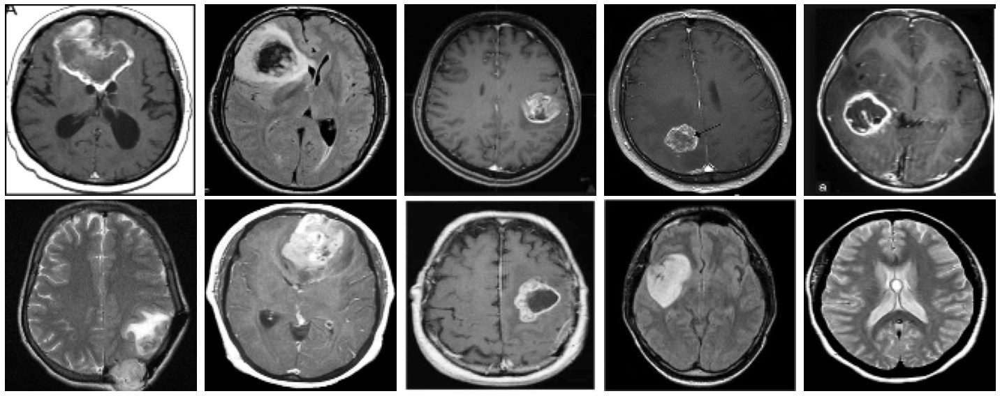

In [9]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

# The Architecture

In [10]:
def build_generator():

    """
        Generator model "generates" images using random noise. The random noise AKA Latent Vector
        is sampled from a Normal Distribution which is given as the input to the Generator. Using
        Transposed Convolution, the latent vector is transformed to produce an image
        We use 3 Conv2DTranspose layers (which help in producing an image using features; opposite
        of Convolutional Learning)

        Input: Random Noise / Latent Vector
        Output: Image
    """

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ], 
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

    return model

In [11]:
def build_discriminator():
    
    """
        Discriminator is the model which is responsible for classifying the generated images
        as fake or real. Our end goal is to create a Generator so powerful that the Discriminator
        is unable to classify real and fake images
        A simple Convolutional Neural Network with 2 Conv2D layers connected to a Dense output layer
        Output layer activation is Sigmoid since this is a Binary Classifier

        Input: Generated / Real Image
        Output: Validity of Image (Fake or Real)

    """

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",
                        optimizer=OPTIMIZER)

    return model

In [12]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False 

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      640       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 256)   

In [13]:
def sample_images(noise, subplots, figsize=(22,8), save=False):
    generated_images = generator.predict(noise)
    plt.figure(figsize=figsize)
    
    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')    
                                                                            
        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        if save == True:
            img_name = "gen" + str(i)
            plt.savefig(img_name)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## The Training

100%|██████████| 3750/3750 [05:29<00:00, 11.39it/s]


EPOCH: 1 Generator Loss: 6.3446 Discriminator Loss: 0.0478


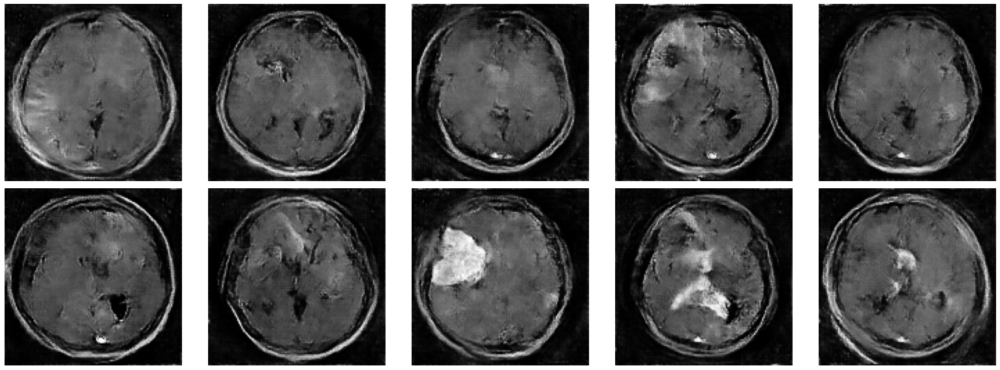

100%|██████████| 3750/3750 [05:20<00:00, 11.71it/s]


EPOCH: 2 Generator Loss: 5.9254 Discriminator Loss: 0.0023


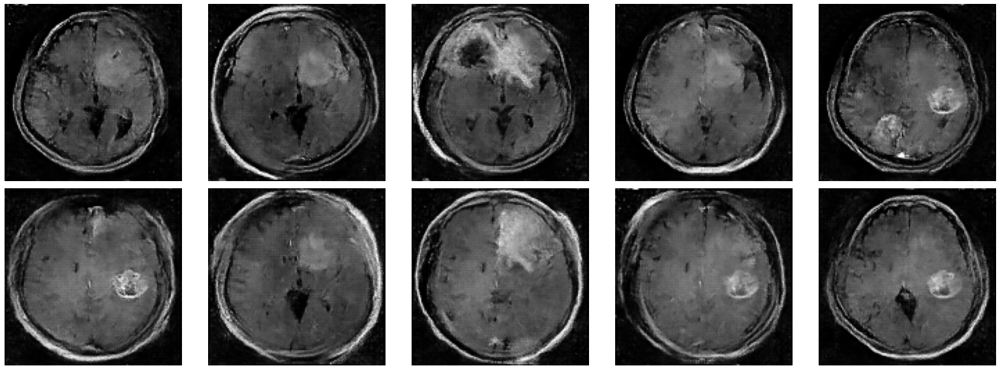

100%|██████████| 3750/3750 [05:17<00:00, 11.80it/s]


EPOCH: 3 Generator Loss: 5.2215 Discriminator Loss: 0.0408


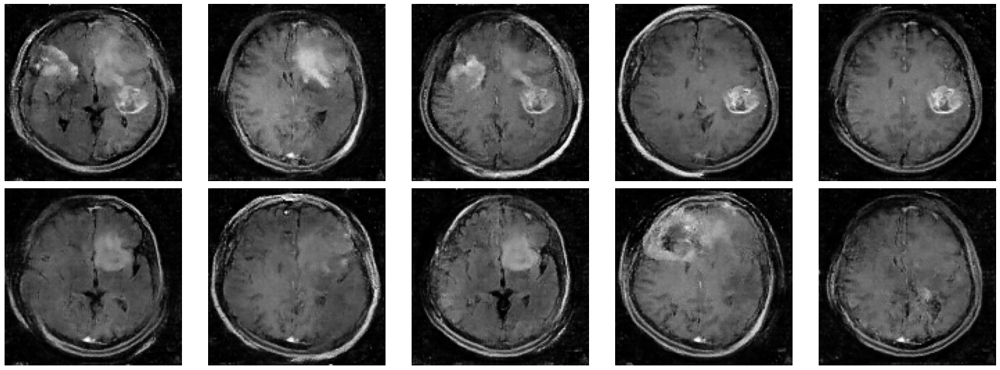

100%|██████████| 3750/3750 [05:18<00:00, 11.79it/s]


EPOCH: 4 Generator Loss: 3.4690 Discriminator Loss: 0.0161


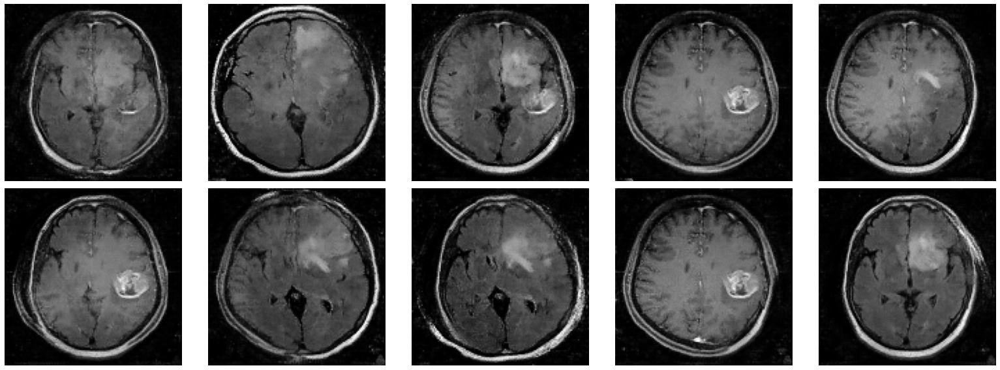

100%|██████████| 3750/3750 [05:19<00:00, 11.74it/s]


EPOCH: 5 Generator Loss: 3.9375 Discriminator Loss: 0.0378


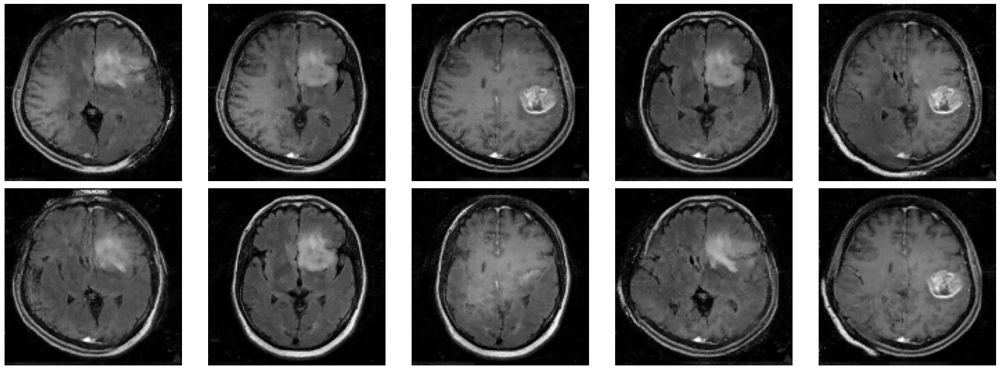

100%|██████████| 3750/3750 [05:22<00:00, 11.63it/s]


EPOCH: 6 Generator Loss: 5.8280 Discriminator Loss: 0.0424


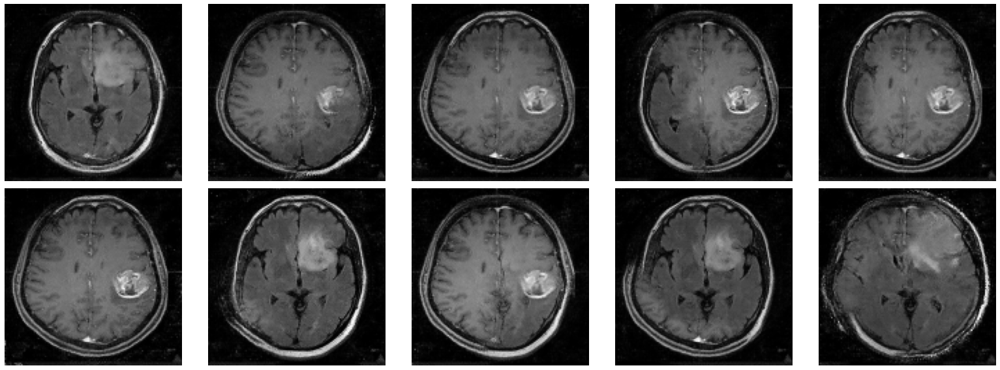

100%|██████████| 3750/3750 [05:22<00:00, 11.64it/s]


EPOCH: 7 Generator Loss: 2.1251 Discriminator Loss: 0.4679


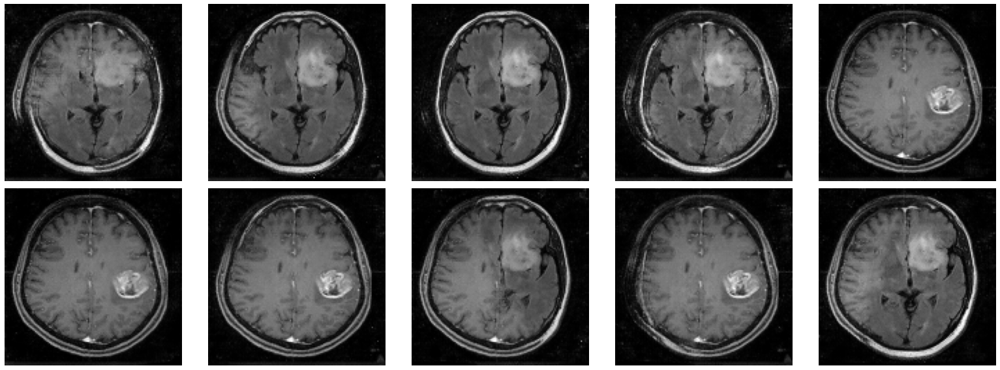

100%|██████████| 3750/3750 [05:22<00:00, 11.61it/s]


EPOCH: 8 Generator Loss: 5.6223 Discriminator Loss: 0.0714


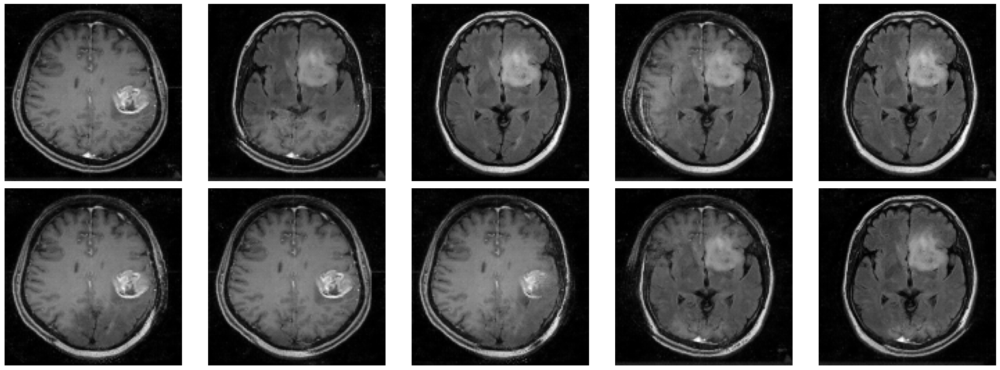

100%|██████████| 3750/3750 [05:22<00:00, 11.61it/s]


EPOCH: 9 Generator Loss: 5.0983 Discriminator Loss: 0.0918


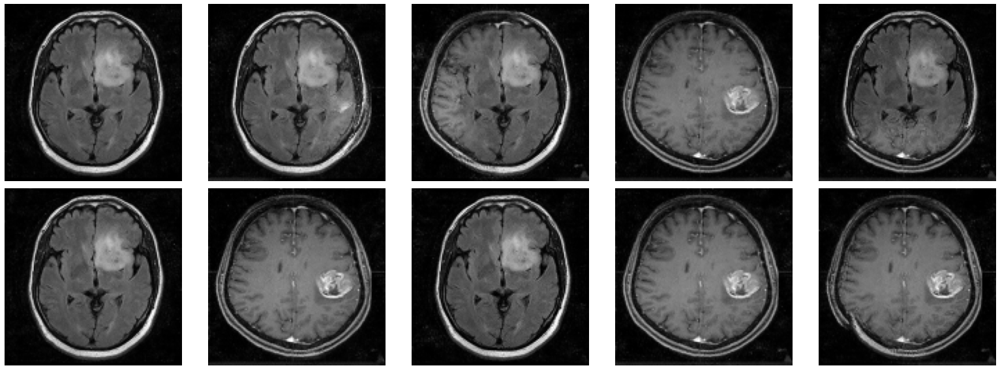

100%|██████████| 3750/3750 [05:27<00:00, 11.44it/s]


EPOCH: 10 Generator Loss: 3.4853 Discriminator Loss: 0.0883


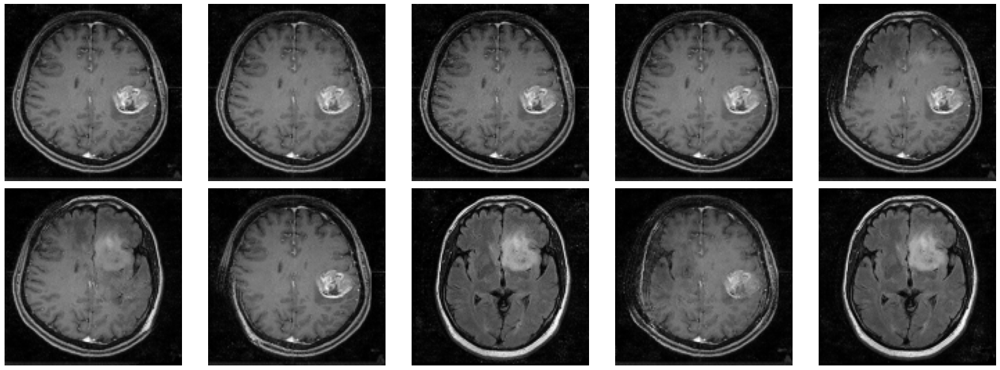

In [ ]:
np.random.seed(SEED)
for epoch in range(10):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)
        
        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)
        
        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))

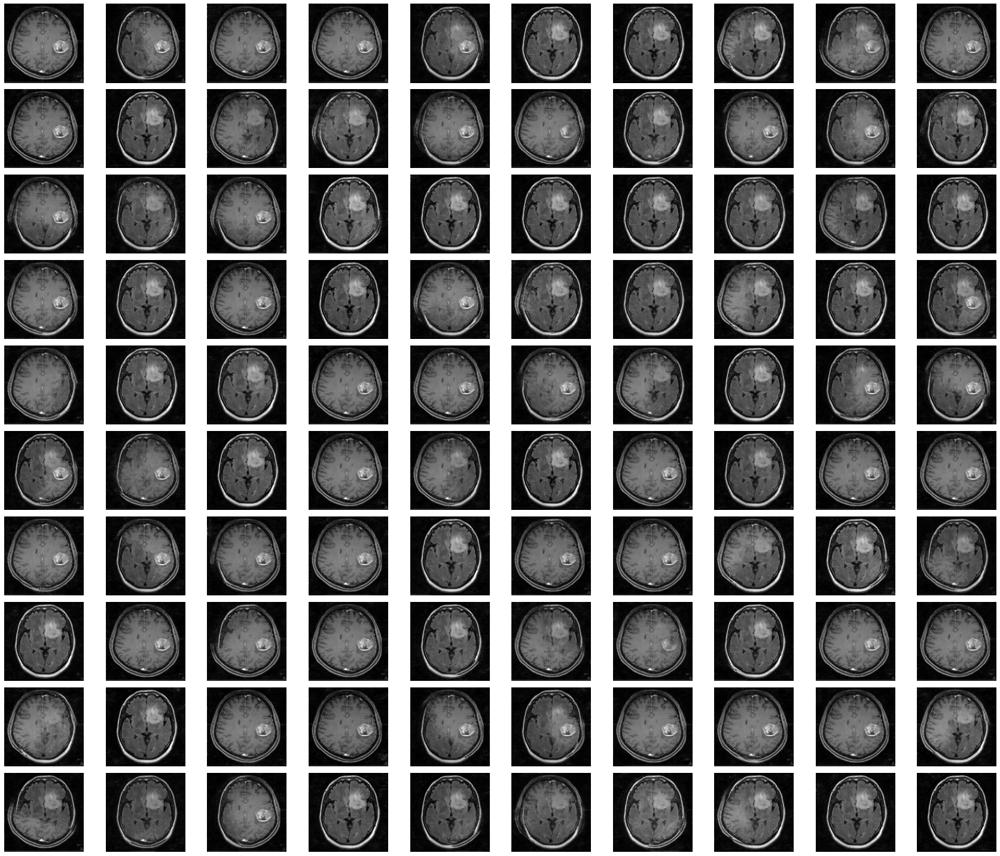

In [ ]:
noise = np.random.normal(0, 1, size=(100, NOISE_DIM))
sample_images(noise, (10,10), (24,20), save=True)

In [16]:
generated_images = generator.predict(noise)
generated_images.shape

(100, 128, 128, 1)

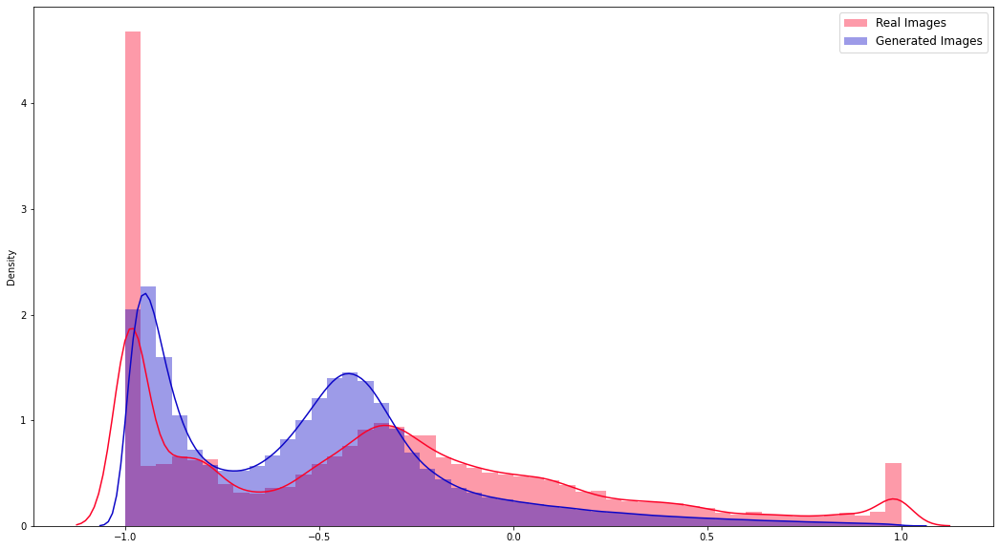

In [17]:
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))

sns.distplot(X_train, label='Real Images', hist=True, color='#fc0328', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='#0c06c7', ax=axs)

axs.legend(loc='upper right', prop={'size': 12})

plt.show()

<p style="font-size:20px">
    As we can see from the plot, the distribution of Generated Images is approximately the same as that of the Real Images. From this we can conclude that the generated images are a true representative of the real ones, capturing most of the variations.
</p>

### Performance Metrics

In [25]:
import numpy as np
import cv2
from skimage.metrics import structural_similarity as ssim

In [32]:
def calculate_ssim(real_images, generated_images, resize_to=(256, 256)):
    """
    Calculate Structural Similarity Index (SSIM) between real and generated images.
    """
    resized_real_images = [cv2.resize(img, resize_to) for img in real_images]
    resized_generated_images = [cv2.resize(img, resize_to) for img in generated_images]
    
    ssim_total = 0.0
    for i in range(len(resized_real_images)):
        ssim_val = ssim(resized_real_images[i], resized_generated_images[i], full=True)[0]
        ssim_total += ssim_val
    avg_ssim = ssim_total / len(resized_real_images)
    return avg_ssim


In [33]:
# Generate some images for evaluation
noise_eval = np.random.normal(0, 1, size=(X_train.shape[0], NOISE_DIM))
generated_images_eval = generator.predict(noise_eval)

# Calculate SSIM
ssim_score = calculate_ssim(X_train, generated_images_eval)
print("SSIM Score:", ssim_score)

SSIM Score: 0.24273970624640012
Infidelity Score: 0.3842482


In [38]:
import numpy as np
import cv2

def psnr(original_image, generated_image):
    # Calculate MSE (Mean Squared Error)
    mse = np.mean((original_image - generated_image) ** 2)
    # Maximum pixel value of the image
    max_pixel = 255.0
    # Calculate PSNR using the formula
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

# Assuming original_image and generated_image are numpy arrays of shape (height, width, channels)
# You need to convert them to uint8 format before passing to the psnr function

# Convert images to uint8 format
original_image_uint8 = np.uint8(X_train)
generated_image_uint8 = np.uint8(generated_images_eval)

# Calculate PSNR
psnr_score = psnr(original_image_uint8, generated_image_uint8)
print("PSNR:", psnr_score)

PSNR: 60.66221621078604


In [ ]:
# Placeholder function for prepare_data, replace with your actual data preparation code
def prepare_data():
    # Load and preprocess your dataset
    pass

# Define hyperparameters to search over
hyperparameters = {
    'NOISE_DIM': [100],  # Adjusted to match the expected input shape of the generator
    'BATCH_SIZE': [4, 8],
    'STEPS_PER_EPOCH': [1000, 2000]
}

best_loss = float('inf')
best_hyperparameters = None

for noise_dim in hyperparameters['NOISE_DIM']:
    for batch_size in hyperparameters['BATCH_SIZE']:
        for steps_per_epoch in hyperparameters['STEPS_PER_EPOCH']:
            np.random.seed(42)
            gen_loss_history = []
            disc_loss_history = []

            for epoch in range(1):
                for batch in tqdm(range(steps_per_epoch)):
                    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
                    fake_X = generator.predict(noise)
                    idx = np.random.randint(0, X_train.shape[0], size=batch_size)
                    real_X = X_train[idx]
                    X = np.concatenate((real_X, fake_X))
                    disc_y = np.zeros(2 * batch_size)
                    disc_y[:batch_size] = 1
                    d_loss = discriminator.train_on_batch(X, disc_y)
                    y_gen = np.ones(batch_size)
                    g_loss = gan.train_on_batch(noise, y_gen)
                    gen_loss_history.append(g_loss)
                    disc_loss_history.append(d_loss)

                avg_g_loss = np.mean(gen_loss_history)
                avg_d_loss = np.mean(disc_loss_history)

                if avg_g_loss < best_loss:
                    best_loss = avg_g_loss
                    best_hyperparameters = {
                        'NOISE_DIM': noise_dim,
                        'BATCH_SIZE': batch_size,
                        'STEPS_PER_EPOCH': steps_per_epoch
                    }

                print(f"EPOCH: {epoch + 1} Generator Loss: {avg_g_loss:.4f} Discriminator Loss: {avg_d_loss:.4f}")

            print(f"Best Hyperparameters: {best_hyperparameters} with Best Loss: {best_loss:.4f}")

            # Optionally, you can save or visualize the results here


100%|██████████| 1000/1000 [01:22<00:00, 12.14it/s]


EPOCH: 1 Generator Loss: 2.4969 Discriminator Loss: 0.2763
Best Hyperparameters: {'NOISE_DIM': 100, 'BATCH_SIZE': 4, 'STEPS_PER_EPOCH': 1000} with Best Loss: 2.4969


100%|██████████| 2000/2000 [02:45<00:00, 12.08it/s]


EPOCH: 1 Generator Loss: 4.7004 Discriminator Loss: 0.0937
Best Hyperparameters: {'NOISE_DIM': 100, 'BATCH_SIZE': 4, 'STEPS_PER_EPOCH': 1000} with Best Loss: 2.4969


100%|██████████| 1000/1000 [01:56<00:00,  8.62it/s]


EPOCH: 1 Generator Loss: 6.2441 Discriminator Loss: 0.0311
Best Hyperparameters: {'NOISE_DIM': 100, 'BATCH_SIZE': 4, 'STEPS_PER_EPOCH': 1000} with Best Loss: 2.4969


100%|██████████| 2000/2000 [03:48<00:00,  8.75it/s]

EPOCH: 1 Generator Loss: 6.6827 Discriminator Loss: 0.0436
Best Hyperparameters: {'NOISE_DIM': 100, 'BATCH_SIZE': 4, 'STEPS_PER_EPOCH': 1000} with Best Loss: 2.4969


In [ ]:
print(f"Best Hyperparameters: {best_hyperparameters} with Best Loss: {best_loss:.4f}")

Best Hyperparameters: {'NOISE_DIM': 100, 'BATCH_SIZE': 4, 'STEPS_PER_EPOCH': 1000} with Best Loss: 2.4969


100%|██████████| 1000/1000 [01:22<00:00, 12.16it/s]


EPOCH: 1 Generator Loss: 7.5062 Discriminator Loss: 0.0106


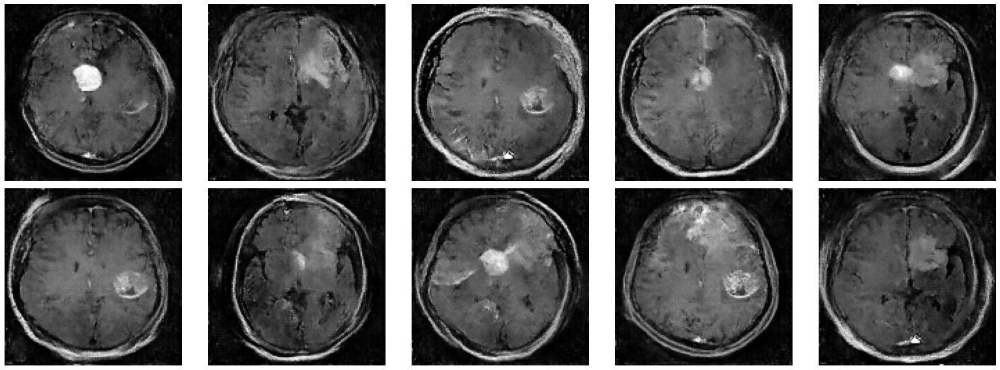

100%|██████████| 1000/1000 [01:22<00:00, 12.16it/s]


EPOCH: 2 Generator Loss: 6.3244 Discriminator Loss: 0.0036


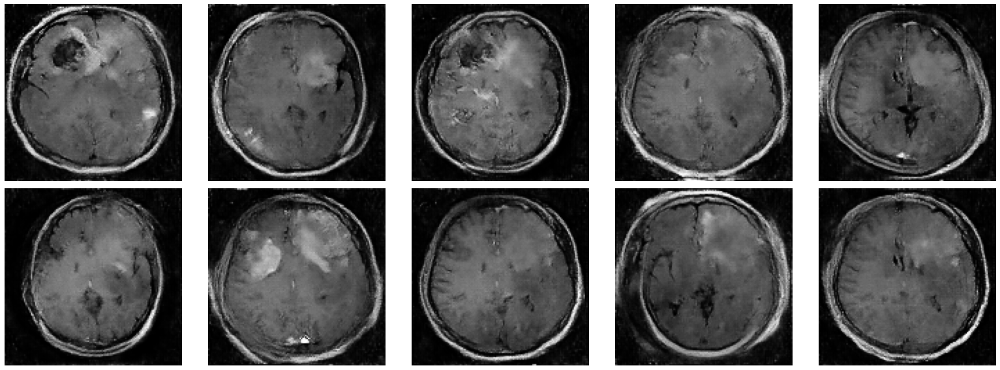

100%|██████████| 1000/1000 [01:22<00:00, 12.09it/s]


EPOCH: 3 Generator Loss: 6.5770 Discriminator Loss: 0.0003


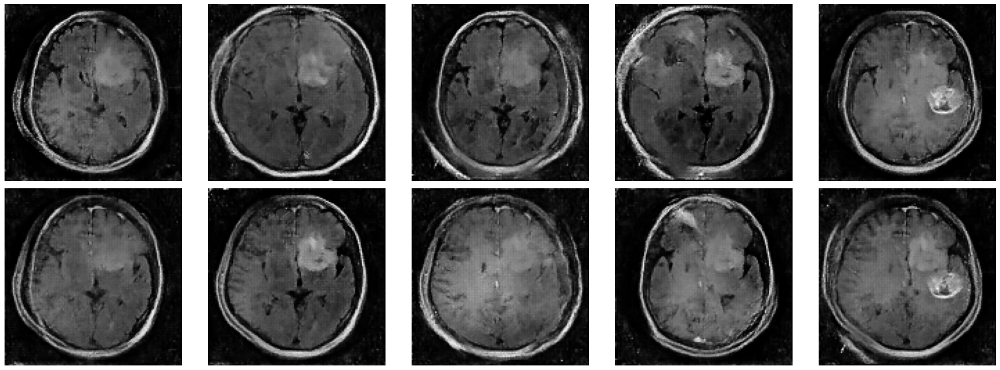

100%|██████████| 1000/1000 [01:22<00:00, 12.06it/s]


EPOCH: 4 Generator Loss: 7.2262 Discriminator Loss: 0.0243


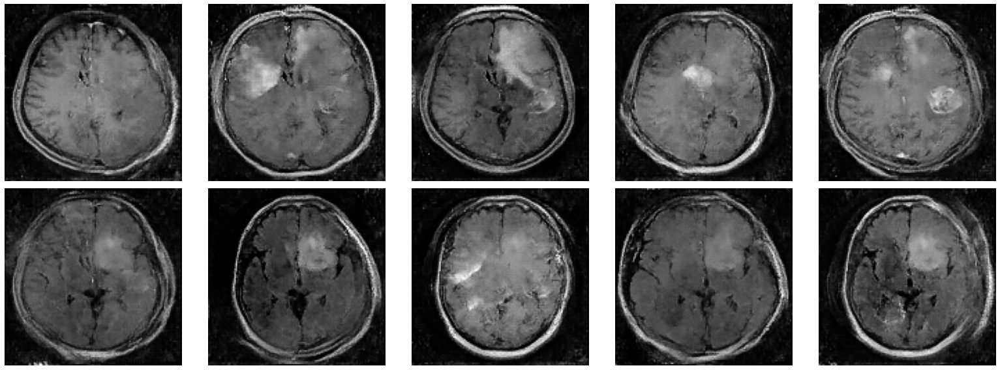

100%|██████████| 1000/1000 [01:24<00:00, 11.86it/s]


EPOCH: 5 Generator Loss: 6.1770 Discriminator Loss: 0.0011


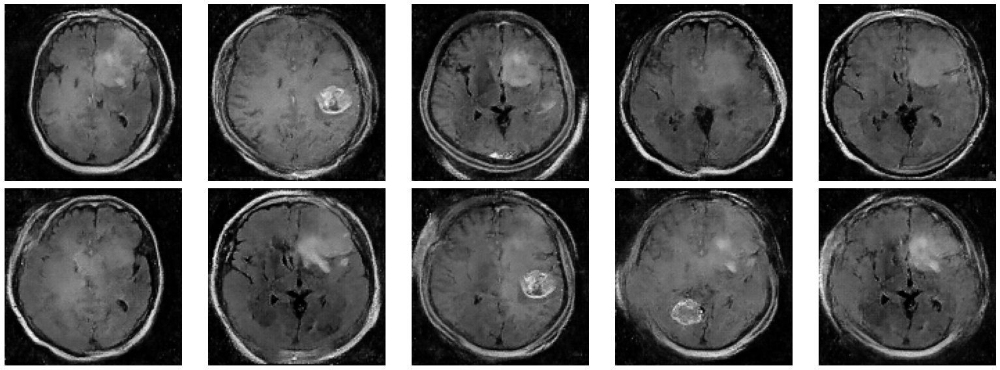

100%|██████████| 1000/1000 [01:23<00:00, 11.96it/s]


EPOCH: 6 Generator Loss: 8.6299 Discriminator Loss: 0.0016


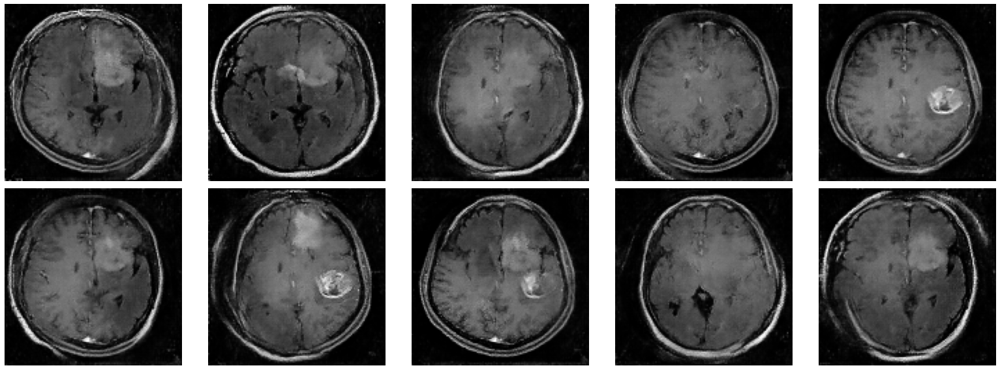

100%|██████████| 1000/1000 [01:22<00:00, 12.09it/s]


EPOCH: 7 Generator Loss: 8.5112 Discriminator Loss: 0.0046


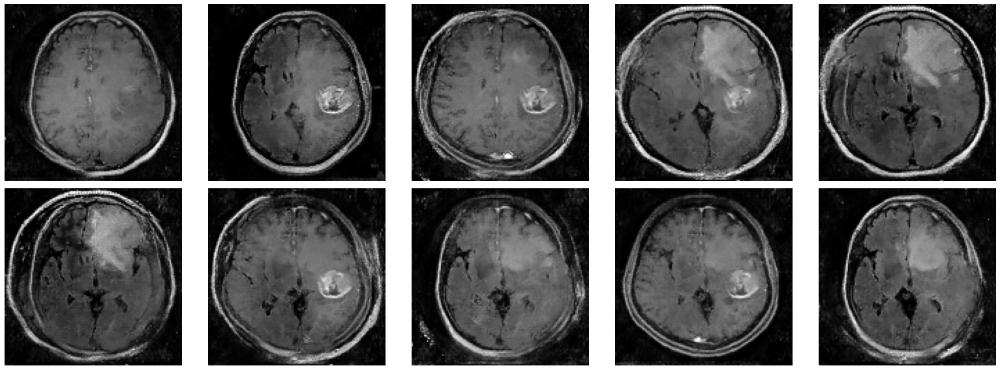

100%|██████████| 1000/1000 [01:22<00:00, 12.15it/s]


EPOCH: 8 Generator Loss: 8.8308 Discriminator Loss: 0.0001


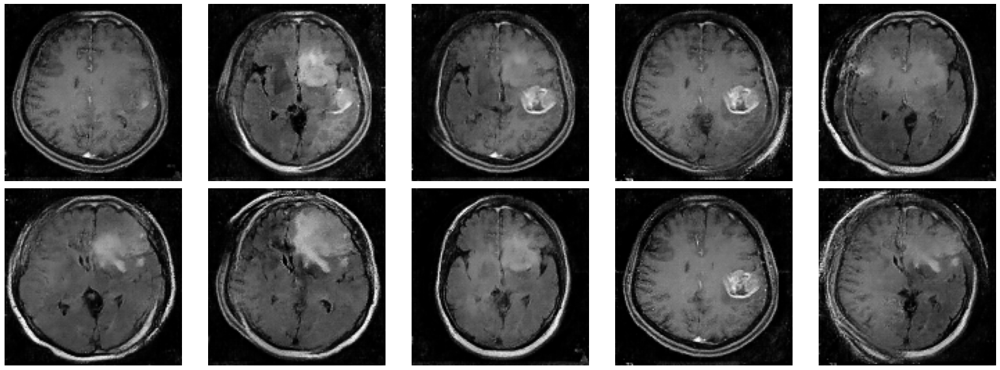

100%|██████████| 1000/1000 [01:22<00:00, 12.19it/s]


EPOCH: 9 Generator Loss: 7.7232 Discriminator Loss: 0.0167


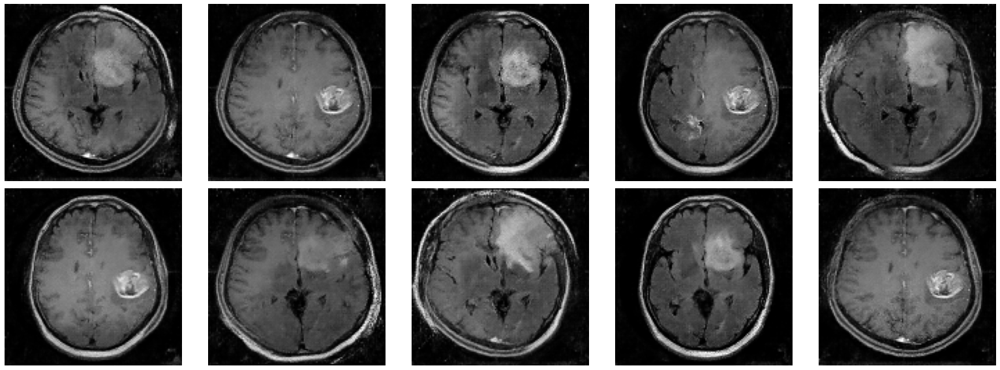

100%|██████████| 1000/1000 [01:22<00:00, 12.18it/s]


EPOCH: 10 Generator Loss: 9.6946 Discriminator Loss: 0.0004


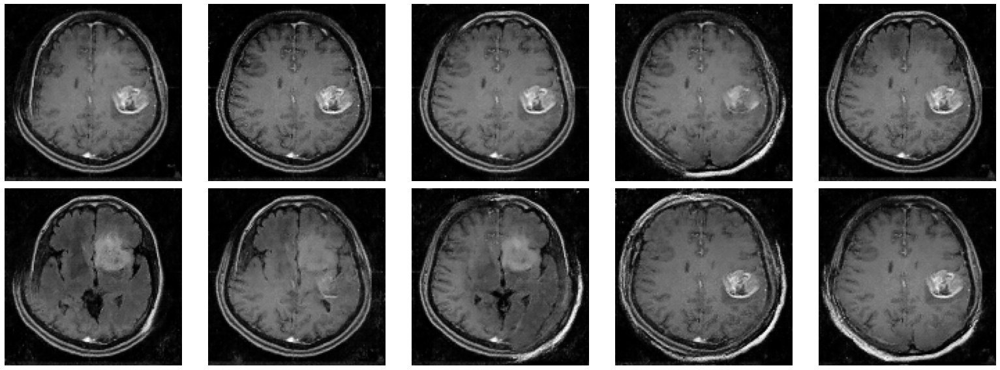

In [ ]:
np.random.seed(SEED)
NOISE_DIM=100
BATCH_SIZE=4
STEPS_PER_EPOCH=1000
for epoch in range(10):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)
        
        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)
        
        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)
        gen_loss_history.append(g_loss)
        disc_loss_history.append(d_loss)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))

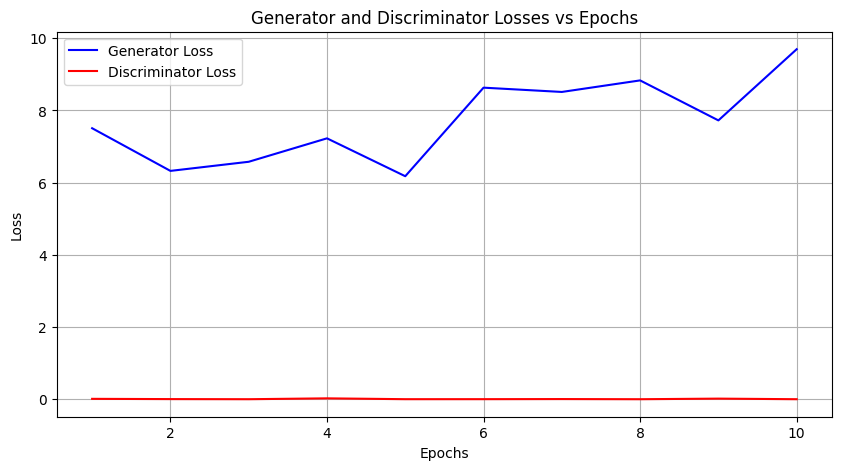

In [ ]:
import matplotlib.pyplot as plt

# Generator and discriminator losses
generator_losses = [7.5062, 6.3244, 6.5770, 7.2262, 6.1770, 8.6299, 8.5112, 8.8308, 7.7232, 9.6946]
discriminator_losses = [0.0106, 0.0036, 0.0003, 0.0243, 0.0011, 0.0016, 0.0046, 0.0001, 0.0167, 0.0004]

epochs = range(1, len(generator_losses) + 1)

plt.figure(figsize=(10, 5))

# Plot generator loss
plt.plot(epochs, generator_losses, label='Generator Loss', color='blue')

# Plot discriminator loss
plt.plot(epochs, discriminator_losses, label='Discriminator Loss', color='red')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Generator and Discriminator Losses vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


# Conclusion
We were able to generate brain tumor images using DC-GANs and a small dataset of tumor images. We were able to get good results in image generation along with high definition and good variability. We were successfully able to verify our results and augment data using image synthesis of Brain tumor images.

###                                                                       ==========THE END==========